In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
%cd /content/gdrive/My Drive/CS698_Research/content

!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5

!git reset --hard 5ba1de0cdcc414c69ceb7a4c45eb1e3895eca32a
%cd /content/gdrive/My Drive/CS698_Research/content

!pip install -r yolov5/requirements.txt  # install dependencies
%cd yolov5

import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.6.0+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15079MB, multi_processor_count=40)


In [ ]:
%cd /content/gdrive/My Drive/CS698_Research/content

/content/gdrive/My Drive/CS698_Research/content


In [ ]:
#YAML file containing the each class names
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['mask_weared_incorrect', 'with_mask', 'without_mask']

In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#Defining according to the model: yolov5s (Also compared the result with yolov5x)
%cd /content/gdrive/My Drive/CS698_Research/content

with open('yolov5/models/custom_yolov5s.yaml', 'w') as f:
  # parameters
  f.write('nc: ' + num_classes + '\n')
  #f.write('nc: ' + str(len(class_labels)) + '\n')
  f.write('depth_multiple: 0.33'  + '\n') # model depth multiple
  f.write('width_multiple: 0.50'  + '\n')  # layer channel multiple
  f.write('\n')
  f.write('anchors:' + '\n')
  f.write('  - [10,13, 16,30, 33,23] ' + '\n')
  f.write('  - [30,61, 62,45, 59,119]' + '\n')
  f.write('  - [116,90, 156,198, 373,326] ' + '\n')
  f.write('\n')

  f.write('backbone:' + '\n')
  f.write('  [[-1, 1, Focus, [64, 3]],' + '\n')
  f.write('   [-1, 1, Conv, [128, 3, 2]],' + '\n')
  f.write('   [-1, 3, Bottleneck, [128]],' + '\n')
  f.write('   [-1, 1, Conv, [256, 3, 2]],' + '\n')
  f.write('   [-1, 9, BottleneckCSP, [256]],' + '\n')
  f.write('   [-1, 1, Conv, [512, 3, 2]], ' + '\n')
  f.write('   [-1, 9, BottleneckCSP, [512]],' + '\n')
  f.write('   [-1, 1, Conv, [1024, 3, 2]],' + '\n')
  f.write('   [-1, 1, SPP, [1024, [5, 9, 13]]],' + '\n')
  f.write('   [-1, 6, BottleneckCSP, [1024]],' + '\n')
  f.write('  ]' + '\n')
  f.write('\n')

  f.write('head:'  + '\n')
  f.write('  [[-1, 3, BottleneckCSP, [1024, False]],'  + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  f.write('   [-2, 1, nn.Upsample, [None, 2, "nearest"]],' + '\n')
  
  f.write('   [[-1, 6], 1, Concat, [1]],' + '\n')
  f.write('   [-1, 1, Conv, [512, 1, 1]],' + '\n')
  f.write('   [-1, 3, BottleneckCSP, [512, False]],' + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  
  f.write('   [-2, 1, nn.Upsample, [None, 2, "nearest"]],' + '\n')
  f.write('   [[-1, 4], 1, Concat, [1]],' + '\n')
  f.write('   [-1, 1, Conv, [256, 1, 1]],' + '\n')
  f.write('   [-1, 3, BottleneckCSP, [256, False]],' + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  f.write('\n' )
  f.write('   [[], 1, Detect, [nc, anchors]],' + '\n')
  f.write('  ]' + '\n')

print('custom model config written!')

/content/gdrive/My Drive/CS698_Research/content
custom model config written!


In [ ]:
# Training with model: yolov5s

%%time
%cd /content/gdrive/My Drive/CS698_Research/content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results --nosave --cache

/content/gdrive/My Drive/CS698_Research/content/yolov5
Apex recommended for faster mixed precision training: https://github.com/NVIDIA/apex
{'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.58, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.014, 'hsv_s': 0.68, 'hsv_v': 0.36, 'degrees': 0.0, 'translate': 0.0, 'scale': 0.5, 'shear': 0.0}
Your branch is behind 'origin/master' by 403 commits, and can be fast-forwarded.
  (use "git pull" to update your local branch)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='../data.yaml', device='', epochs=100, evolve=False, img_size=[416], multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=True, notest=False, rect=False, resume=False, single_cls=False, weights='')
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

2020-11-03 05:55:23.815206: I tensorflow/stre

In [ ]:
# Start tensorboard
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

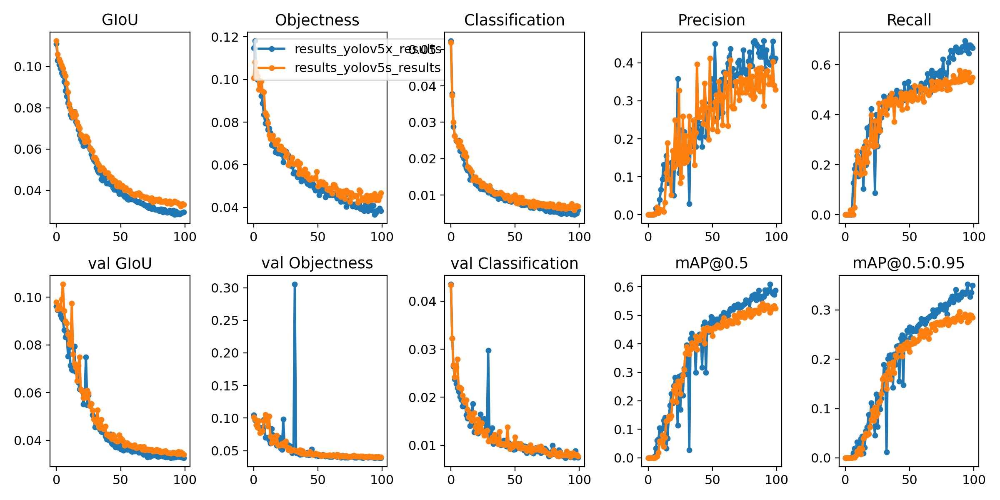

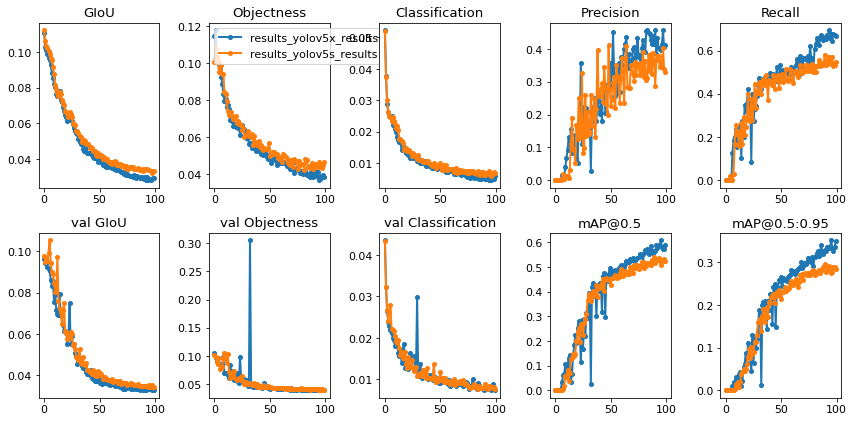

In [ ]:
#Importing Graphs

from utils.utils import plot_results; plot_results()  # plot results.txt as results.png
Image(filename='./results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


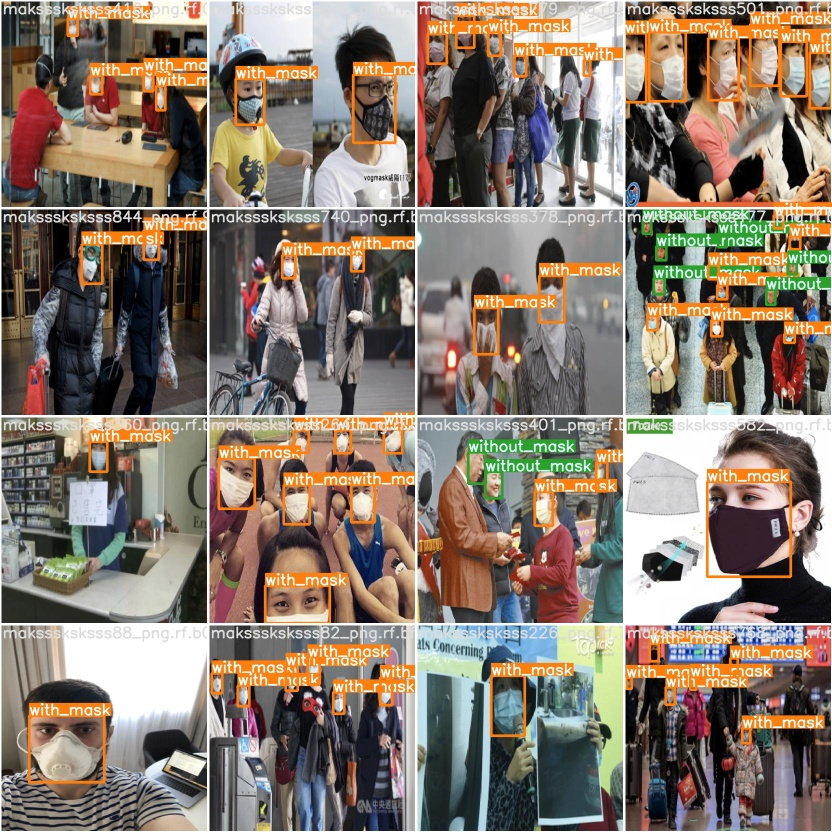

In [ ]:
#Ground Truth Data

print("GROUND TRUTH TRAINING DATA:")
Image(filename='./test_batch0_gt.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


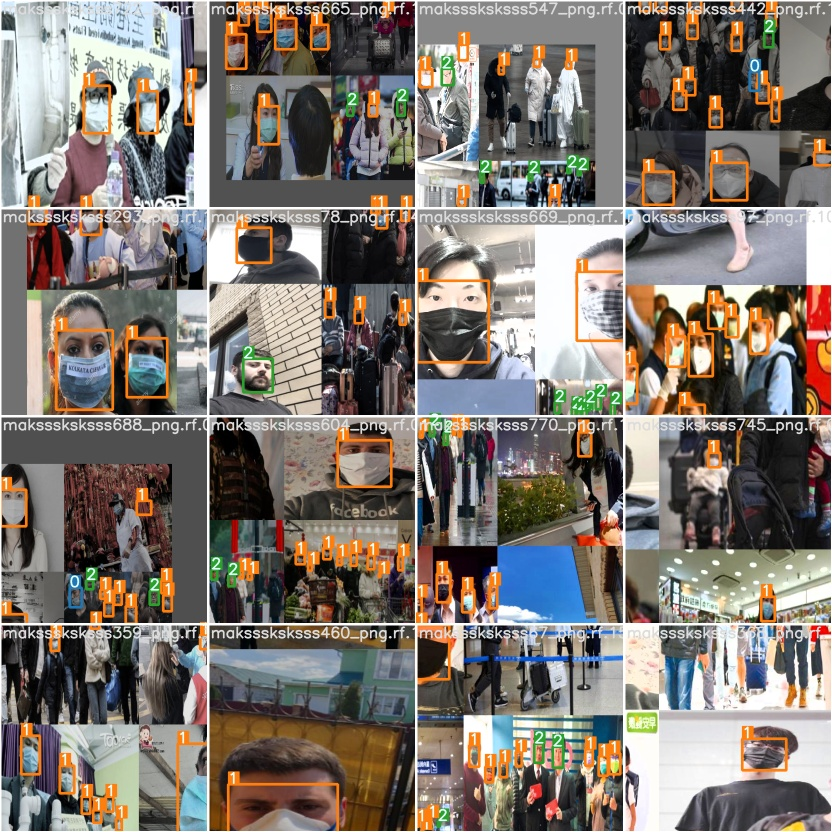

In [ ]:
#Augmented Training Example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='./train_batch2.jpg', width=900)

In [ ]:
# Saving trained weights in the directory on google drive.
%ls weights/

download_weights.sh      last_yolov5x_results.pt
last_yolov5s_results.pt  yolov5s.pt


In [ ]:
#Testing the trained model on an image.
%cd /content/gdrive/My Drive/CS698_Research/content/yolov5/
!python detect.py --weights weights/last_yolov5s_results.pt --img 416 --conf 0.4 --source ../test/images


/content/gdrive/My Drive/CS698_Research/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='../test/images', update=False, view_img=False, weights='weights/last_yolov5s_results.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

/content/gdrive/My Drive/CS698_Research/content/yolov5/utils/utils.py:581: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  i, j = (x[:, 5:] > conf_thres).nonzero().t()
image 1/85 ../test/images/maksssksksss114_png.rf.9cc761ee7d5870ea814a00ab340e603f.jpg: 416x416 2 with_masks, Done. (0.012s)
image 2/85 ../test/images/maksssksksss124_png.rf.8a56076e7454ceb676962c1da1ff602f.jpg: 416x416 3 with_masks, 3 without_masks, Done. (0.

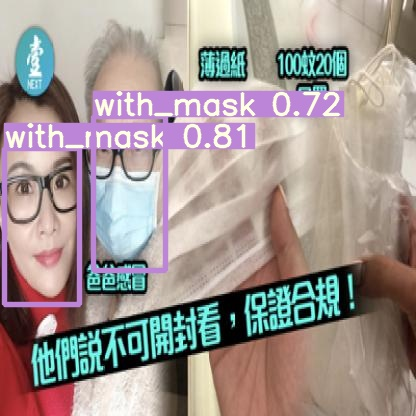

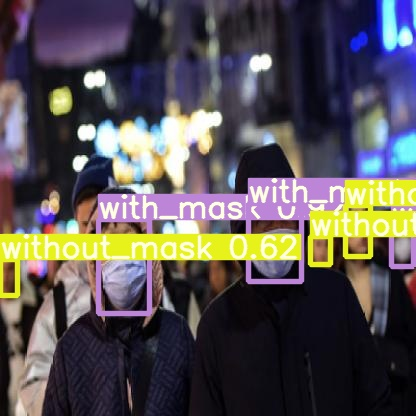

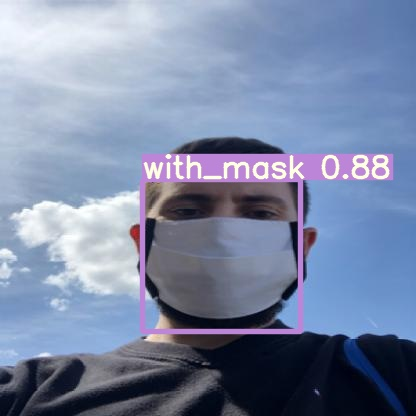

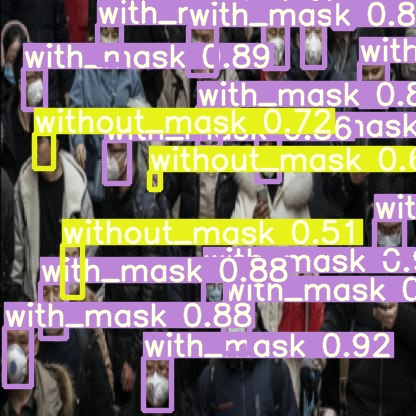

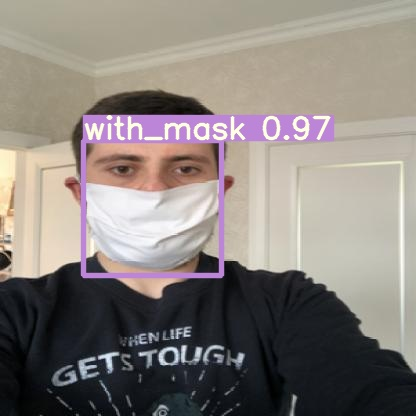

...

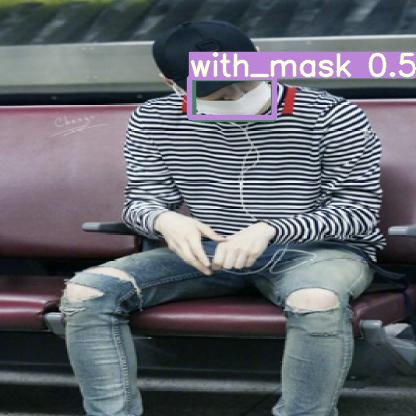

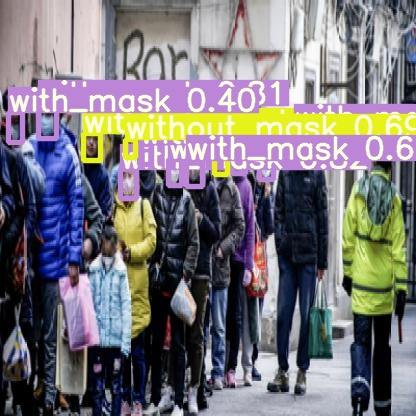

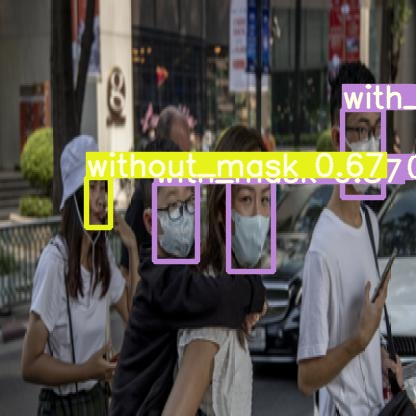

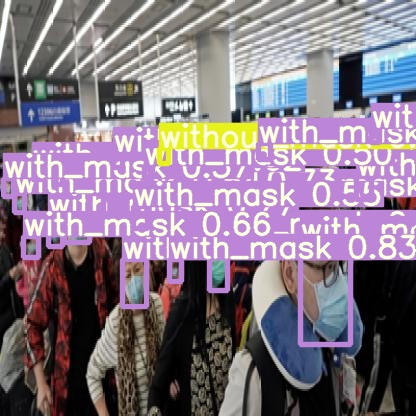

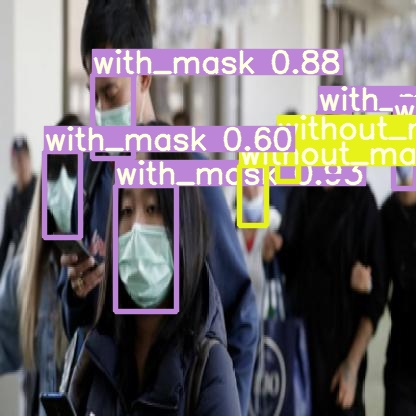

In [ ]:
#display inference on ALL test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/gdrive/My Drive/CS698_Research/content/yolov5/inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#%cd /content/gdrive/My Drive/CS698_Research/content
%cp /content/yolov5/weights/last_yolov5s_results.pt '/content/gdrive/My Drive/CS698_Research/content'

cp: cannot stat '/content/yolov5/weights/last_yolov5s_results.pt': No such file or directory


In [ ]:
%cd /content/gdrive/My Drive/CS698_Research/content/yolov5/
!python detect.py --weights '/content/gdrive/My Drive/CS698_Research/content/yolov5/weights/last_yolov5s_results.pt' \
  --img 640 --conf 0.1 --source '/content/gdrive/My Drive/CS698_Research/content/yolov5/JF5.jpg'

/content/gdrive/My Drive/CS698_Research/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', img_size=640, iou_thres=0.5, output='inference/output', save_txt=False, source='/content/gdrive/My Drive/CS698_Research/content/yolov5/JF5.jpg', update=False, view_img=False, weights='/content/gdrive/My Drive/CS698_Research/content/yolov5/weights/last_yolov5s_results.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

/content/gdrive/My Drive/CS698_Research/content/yolov5/utils/utils.py:581: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  i, j = (x[:, 5:] > conf_thres).nonzero().t()
image 1/1 /content/gdrive/My Drive/CS698_Research/content/yolov5/JF5.jpg: 576x640 1 without_masks, Done. (0.016s)
Results saved to /content/gdrive/My Drive/

In [ ]:
%cd /content/gdrive/My Drive/CS698_Research/content/yolov5/
!python detect.py --weights '/content/gdrive/My Drive/CS698_Research/content/yolov5/weights/last_yolov5s_results.pt' \
  --conf 0.1 --source '/content/gdrive/My Drive/CS698_Research/content/yolov5/IMG_123.mov'

/content/gdrive/My Drive/CS698_Research/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', img_size=640, iou_thres=0.5, output='inference/output', save_txt=False, source='/content/gdrive/My Drive/CS698_Research/content/yolov5/IMG_123.mov', update=False, view_img=False, weights='/content/gdrive/My Drive/CS698_Research/content/yolov5/weights/last_yolov5s_results.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

/content/gdrive/My Drive/CS698_Research/content/yolov5/utils/utils.py:581: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  i, j = (x[:, 5:] > conf_thres).nonzero().t()
video 1/1 (1/680) /content/gdrive/My Drive/CS698_Research/content/yolov5/IMG_123.mov: 384x640 2 with_masks, 1 without_masks, Done. (0.014s)
video 1/1 (2

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
%cd /content/gdrive/My Drive/CS698_Research/content/yolov5/
!python detect.py --weights '/content/gdrive/My Drive/CS698_Research/content/yolov5/weights/last_yolov5s_results.pt' --conf 0.5 --source "0" 

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/My Drive/CS698_Research/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.5, device='', img_size=640, iou_thres=0.5, output='inference/output', save_txt=False, source='0', update=False, view_img=False, weights='/content/gdrive/My Drive/CS698_Research/content/yolov5/weights/last_yolov5s_results.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

[ WARN:0] global /io/opencv/modules/videoio/src/cap_v4l.cpp (802) open VIDEOIO ERROR: V4L: can't open camera by index 0
1/1: 0... Traceback (most recent call last):
  File "detect.py", line 165, in <module>
    detect()
  File "detect.py", line 44, in detect
    dataset = LoadStreams(source, img_size=imgsz)
  File "/content/gdrive/My Drive/CS698_Research/content/yolov5/utils/datasets.py", line 224, in __init__
    assert cap.isOpen